In [1]:
import velvet as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
from scvi.model.utils import mde
import pymde
from matplotlib.patheffects import withStroke

In [3]:
adata0 = sc.read_h5ad("../data/celltyped_adata.h5ad")

In [11]:
np.median(np.array(adata0.layers['total'].sum(1)))
np.mean(np.array((adata0.layers['total']>0).sum(1)))

4793.7889211100055

In [13]:
adata0.shape[0]/4

11810.75

In [4]:
adata = adata0.copy()
adata = adata[adata.obs.cell_annotation!='other']

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

vt.ut.set_seed(0)
np.random.seed(0)
pymde.seed(0)

genes = vt.pp.select_genes(
    adata[adata.obs.rep!='r4'], # we remove r4 because we stratify by replicate
    n_variable_genes=3000,
    stratify_obs='rep'
)

adata = adata[:, genes]

sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=5, random_state=0)

adata.obsm["X_mde"] = mde(adata.obsm["X_pca"][:,:5])

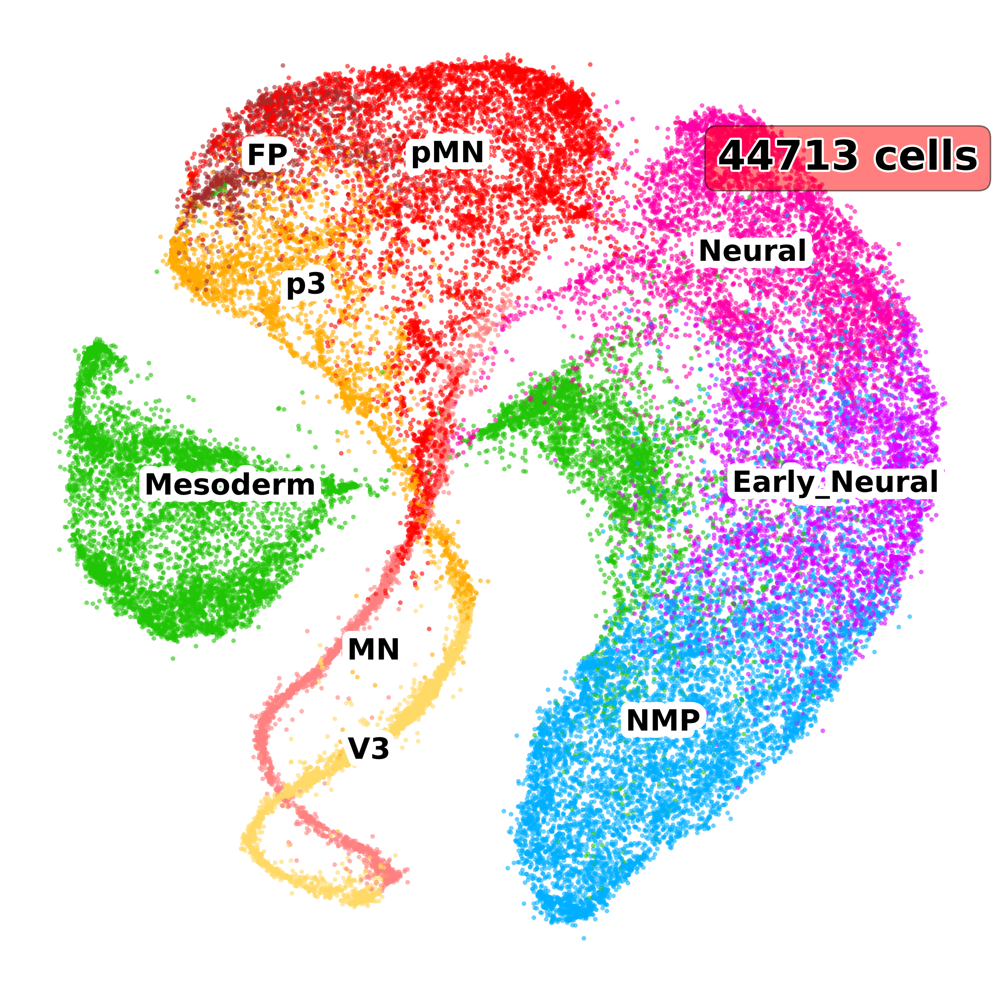

In [5]:
# adata.obs['cell_annotation'] = [a.replace("_", " ") for a in adata.obs.cell_annotation]

fig = plt.figure(figsize=(12,12), dpi=300)
ax = fig.subplots()

sc.pl.embedding(
    adata,
    basis="X_mde",
    color=['cell_annotation'],
    frameon=False, ax=ax,
    ncols=3, size=40, alpha=.6,
    legend_loc='on data', 
    palette=colpal.celltype, 
    legend_fontsize=20, 
    legend_fontoutline=10,
    show=False, 
    title='',
)
props = dict(boxstyle='round', facecolor='red', alpha=0.5)
ax.text(.9,1.3, f'{adata.shape[0]} cells', fontsize=28, bbox=props, fontweight='bold',
        path_effects=[withStroke(linewidth=3, foreground='w')])
plt.savefig("../figures/1.3.0_full_data_celltype.png", bbox_inches='tight', transparent=True)
plt.show()



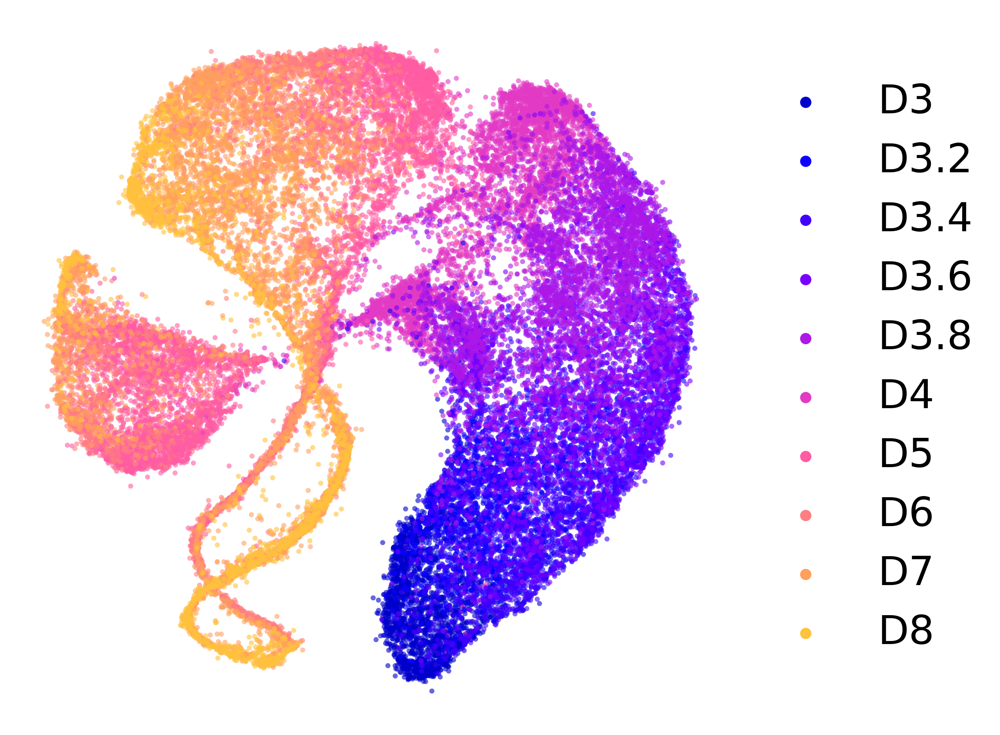

In [6]:
fig = plt.figure(figsize=(8,8), dpi=300)
ax = fig.subplots()

sc.pl.embedding(
    adata,
    basis="X_mde",
    color=['timepoint'],
    frameon=False, ax=ax,
    ncols=3, size=40, alpha=.6,
    legend_loc='right margin', 
    palette=colpal.timepoint, 
    legend_fontsize=25, 
    legend_fontoutline=10,
    show=False, 
    title='',
)
props = dict(boxstyle='round', facecolor='red', alpha=0.5)
plt.savefig("../figures/1.3.1_full_data_timepoint.png", bbox_inches='tight', transparent=True)
plt.show()

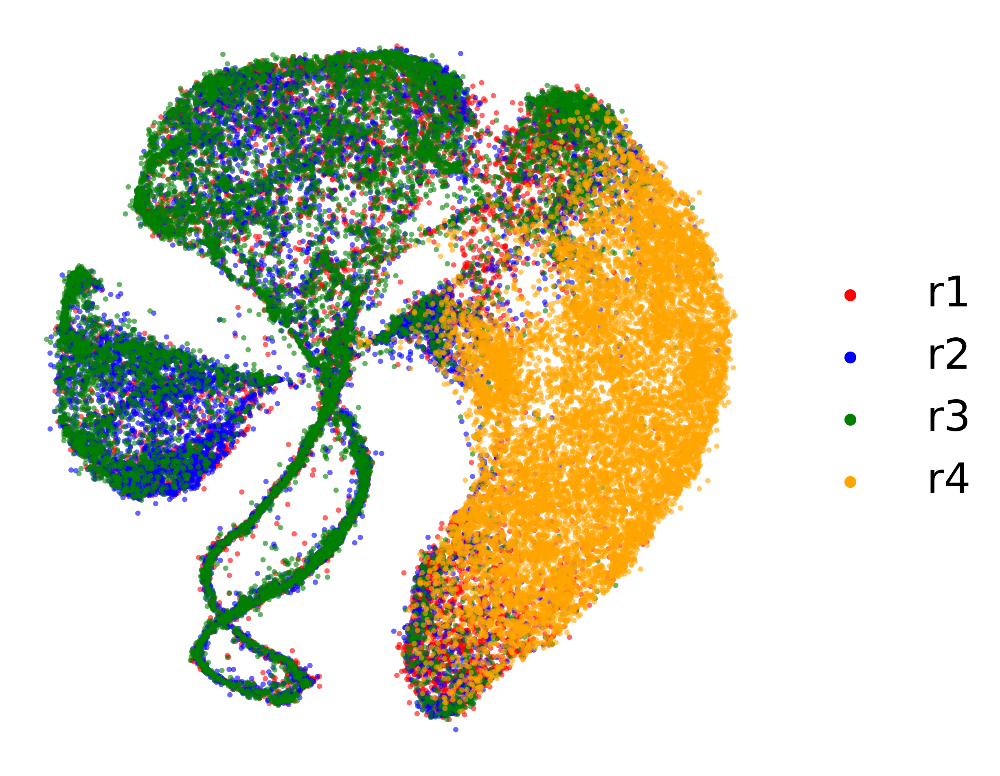

In [7]:
fig = plt.figure(figsize=(8,8), dpi=300)
ax = fig.subplots()

sc.pl.embedding(
    adata,
    basis="X_mde",
    color=['rep'],
    frameon=False, ax=ax,
    ncols=3, size=40, alpha=.6,
    legend_loc='right margin', 
    palette=colpal.replicate, 
    legend_fontsize=25, 
    legend_fontoutline=10,
    show=False, 
    title='',
)
plt.savefig("../figures/1.3.2_full_data_replicate.png", bbox_inches='tight', transparent=True)
plt.show()

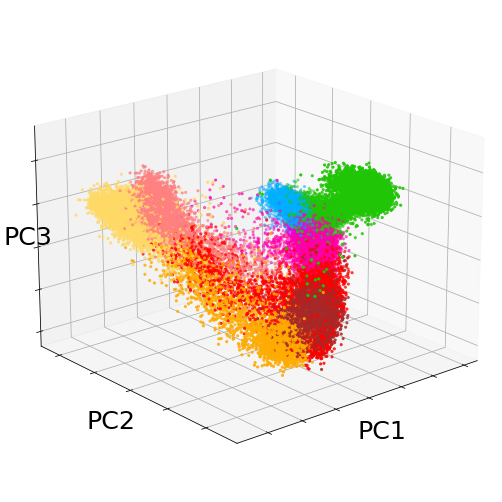

In [8]:
import matplotlib

fig = plt.figure(figsize=(9,24), dpi=70)
ax1 = fig.add_subplot(111, projection='3d')

# Generate some data
x = adata.obsm['X_pca'][:,0]
y = adata.obsm['X_pca'][:,1]
z = adata.obsm['X_pca'][:,2]
c = adata.obs.cell_annotation  # categorical variable

ax1.set_xlabel('PC1', fontsize=26)
ax1.set_ylabel('PC2', fontsize=26)
ax1.set_zlabel('PC3', fontsize=26, labelpad=-15)

ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_zticklabels([])
ax1.scatter(x, y, z, c=[colpal.celltype[ci] for ci in c], s=5)
ax1.view_init(elev=20, azim=50)
plt.tight_layout()
for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

plt.savefig('../figures/1.3.3_PCA1.png', bbox_inches='tight', transparent=True)
plt.show()

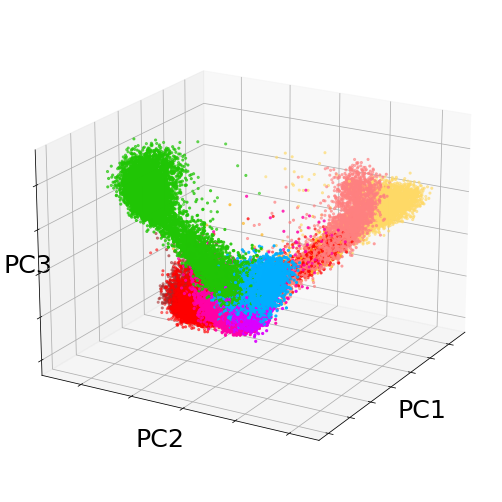

In [9]:
fig = plt.figure(figsize=(9,24), dpi=70)
ax1 = fig.add_subplot(111, projection='3d')

# Generate some data
x = adata.obsm['X_pca'][:,0]
y = adata.obsm['X_pca'][:,1]
z = adata.obsm['X_pca'][:,2]
c = adata.obs.cell_annotation  # categorical variable

ax1.set_xlabel('PC1', fontsize=26)
ax1.set_ylabel('PC2', fontsize=26)
ax1.set_zlabel('PC3', fontsize=26, labelpad=-15)
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_zticklabels([])
ax1.scatter(x, y, z, c=[colpal.celltype[ci] for ci in c], s=5)
ax1.view_init(elev=20, azim=210)

plt.tight_layout()
for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

plt.savefig('../figures/1.3.4_PCA2.png', bbox_inches='tight', transparent=True)
plt.show()

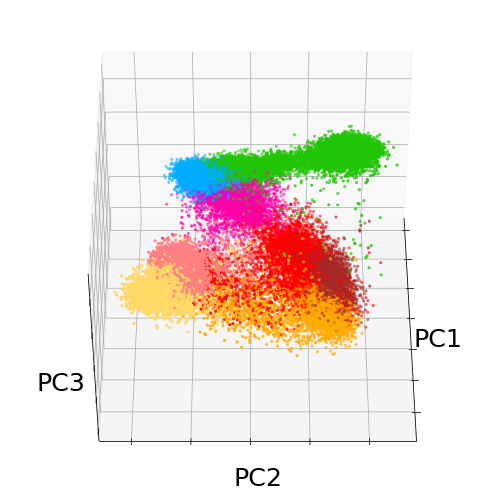

In [10]:
import matplotlib

fig = plt.figure(figsize=(9,24), dpi=70)
ax1 = fig.add_subplot(111, projection='3d')

# Generate some data
x = adata.obsm['X_pca'][:,0]
y = adata.obsm['X_pca'][:,1]
z = adata.obsm['X_pca'][:,2]
c = adata.obs.cell_annotation  # categorical variable

ax1.set_xlabel('PC1', fontsize=26)
ax1.set_ylabel('PC2', fontsize=26)
ax1.set_zlabel('PC3', fontsize=26)
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_zticklabels([])
ax1.scatter(x, y, z, c=[colpal.celltype[ci] for ci in c], s=5)
ax1.view_init(elev=45, azim=0)

plt.tight_layout()

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

plt.savefig('../figures/1.3.5_PCA3.png', bbox_inches='tight', transparent=True)
plt.show()